In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import warnings
import scipy
import anndata as ad
from pathlib import Path


sc.set_figure_params(dpi=150, color_map="viridis")
sc.settings.verbosity = 3

warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


DATA_DIR = "/n/groups/kirschner/xenopus"
NF_stage = "S22"

In [2]:
adata_v2_fp = os.path.join(DATA_DIR, "old_atlas", "adata", f"v2.{NF_stage}.realigned.corrected.h5ad")
adata_v3_fp = os.path.join(DATA_DIR, "old_atlas", "adata", f"v3.{NF_stage}.realigned.corrected.h5ad")

In [3]:
if os.path.exists(adata_v2_fp):
    adata_v2 = ad.read_h5ad(adata_v2_fp)
    # adata_v2.var["gene_id"] = adata_v2.var_names.to_series().str.replace(".g", "")
    # adata_v2.var = annot7.set_index("gene_id").loc[adata_v2.var.gene_id, :]
    # gene_names = adata_v2.var[['human_gene_symbol', 'v9.0_gene_symbol']].astype("str").replace("nan", "")
    # adata_v2.var["gene_name_display"] = \
    #     gene_names["v9.0_gene_symbol"] + " | " + gene_names["human_gene_symbol"] + " | " + gene_names.index.to_series()
else:
    adata_v2 = None

In [4]:
if os.path.exists(adata_v3_fp):
    adata_v3 = ad.read_h5ad(adata_v3_fp)
    adata_v3
else:
    adata_v3 = None

In [5]:
if adata_v2 and adata_v3:
    adata = ad.concat(
        [adata_v2, adata_v3],
        axis=0,
        join="outer",
        label="inDrops_version",
        keys=["v2", "v3"]
    )
    
    # common_layers = set(adata_v2.layers.keys()).intersection(adata_v3.layers.keys())
    
    # for layer in common_layers:
        # adata.layers[layer] = adata_v2.layers[layer] adata_v3.layers[layer]
        
elif adata_v2:
    adata = adata_v2
    adata.obs["inDrops_version"] = "v2"
elif adata_v3:
    adata = adata_v3
    adata.obs["inDrops_version"] = "v3"
else:
    raise ValueError()


In [6]:
REF_DIR = "/n/groups/kirschner/xenopus/reference/Xentr10.0"

gtf_ids = pd.read_csv(os.path.join(REF_DIR, "XENTR_10.0_Xenbase.names.tsv"), sep="\t")
gtf_ids[["eval_forward", "eval_backward"]] = gtf_ids[["eval_forward", "eval_backward"]].astype(float)
gtf_ids_unique = gtf_ids.sort_values("eval_forward").drop_duplicates("gene_id")
cols = ["gene_name", "human_id", "human_name", "human_desc", "eval_forward", "eval_backward"]
adata.var[cols] = gtf_ids_unique.set_index("gene_id").loc[adata.var_names, cols].values
adata.var[["eval_forward", "eval_backward"]] = adata.var[["eval_forward", "eval_backward"]].astype(float)

In [7]:
gtf = pd.read_csv(os.path.join(REF_DIR, "XENTR_10.0_Xenbase.sorted.gtf"), sep="\t", header=None)
gtf["gene_id"] = gtf.iloc[:, 8].str.extract('gene_id "(\w+)"')
gtf["gene_name"] = gtf.iloc[:, 8].str.extract('gene_name "(\w+)"')
gtf

,0,1,2,3,4,5,6,7,8,gene_id,gene_name
0,Chr1,Xenbase,transcript,43856,87766,.,+,.,"transcript_id ""mRNA016866""; gene_id ""XBXT10g00...",XBXT10g003319,LOC101732307
1,Chr1,Xenbase,exon,43856,43947,.,+,.,"transcript_id ""mRNA016866""; gene_id ""XBXT10g00...",XBXT10g003319,LOC101732307
2,Chr1,Xenbase,CDS,43895,43947,.,+,0,"transcript_id ""mRNA016866""; gene_id ""XBXT10g00...",XBXT10g003319,LOC101732307
3,Chr1,Xenbase,exon,48839,49001,.,+,.,"transcript_id ""mRNA016866""; gene_id ""XBXT10g00...",XBXT10g003319,LOC101732307
4,Chr1,Xenbase,CDS,48839,49001,.,+,1,"transcript_id ""mRNA016866""; gene_id ""XBXT10g00...",XBXT10g003319,LOC101732307
...,...,...,...,...,...,...,...,...,...,...,...
1291829,MT,Xenbase,CDS,11859,13676,.,+,0,"transcript_id ""XBXT10g025955""; gene_name ""ND5"";",NaN,ND5
1291830,MT,Xenbase,transcript,13668,14186,.,-,.,"transcript_id ""XBXT10g022652""; gene_id ""XBXT10...",XBXT10g022652,ND6
1291831,MT,Xenbase,CDS,13668,14186,.,-,0,"transcript_id ""XBXT10g022652""; gene_name ""ND6"";",NaN,ND6
1291832,MT,Xenbase,transcript,14258,15399,.,+,.,"transcript_id ""XBXT10g024478""; gene_id ""XBXT10...",XBXT10g024478,CYTB


In [8]:
gtf.loc[(gtf.gene_name.isin(["ddx25", "dazl", "sybu", "dnd1"])) & (gtf.iloc[:,2]=="transcript")]

,0,1,2,3,4,5,6,7,8,gene_id,gene_name
152062,Chr1,Xenbase,transcript,190294518,190331520,.,-,.,"transcript_id ""mRNA016930""; gene_id ""XBXT10g00...",XBXT10g003335,dazl
152064,Chr1,Xenbase,transcript,190294520,190331486,.,-,.,"transcript_id ""mRNA016931""; gene_id ""XBXT10g00...",XBXT10g003335,dazl
361820,Chr3,Xenbase,transcript,26819996,26834706,.,+,.,"transcript_id ""mRNA049198""; gene_id ""XBXT10g00...",XBXT10g009952,dnd1
837849,Chr6,Xenbase,transcript,134344931,134378585,.,-,.,"transcript_id ""mRNA008337""; gene_id ""XBXT10g00...",XBXT10g001662,sybu
837851,Chr6,Xenbase,transcript,134344931,134378745,.,-,.,"transcript_id ""mRNA008338""; gene_id ""XBXT10g00...",XBXT10g001662,sybu
837853,Chr6,Xenbase,transcript,134345782,134378343,.,-,.,"transcript_id ""mRNA008339""; gene_id ""XBXT10g00...",XBXT10g001662,sybu
918619,Chr7,Xenbase,transcript,73429640,73479285,.,+,.,"transcript_id ""mRNA029726""; gene_id ""XBXT10g00...",XBXT10g006013,ddx25


In [9]:
adata[:,adata.var.gene_name=="sybu"].X.max()

5.0

In [10]:
# for gene in ["ddx25", "dazl", "sybu", "dnd1"]:
#     x = 0
#     for layer, counts in adata.layers.items():
#         x_l = counts[:,adata.var.gene_name==gene].sum()
#         print(f"{gene}\t{layer}\t{x_l}")
#         x += x_l
#     print(f"{gene}\tX\t{adata[:,adata.var.gene_name==gene].X.sum()}\t{x}")
    
#     print()

In [11]:
# adata.X = adata.layers["exon"] + adata.layers["intron"] + adata.layers["spanning"]

In [12]:
adata[:,adata.var.gene_name=="ddx25"].X.max()

6.0

# ribo mito genes

## mito

In [13]:
mito_genes = gtf.loc[(gtf.iloc[:,0] == "MT") & (gtf.iloc[:,2] == "transcript"), :]
mito_genes

,0,1,2,3,4,5,6,7,8,gene_id,gene_name
1291808,MT,Xenbase,transcript,2792,3759,.,+,.,"transcript_id ""XBXT10g023778""; gene_id ""XBXT10...",XBXT10g023778,ND1
1291810,MT,Xenbase,transcript,3969,5004,.,+,.,"transcript_id ""XBXT10g021633""; gene_id ""XBXT10...",XBXT10g021633,ND2
1291812,MT,Xenbase,transcript,5395,6951,.,+,.,"transcript_id ""XBXT10g024982""; gene_id ""XBXT10...",XBXT10g024982,COX1
1291814,MT,Xenbase,transcript,7111,7798,.,+,.,"transcript_id ""XBXT10g022822""; gene_id ""XBXT10...",XBXT10g022822,COX2
1291816,MT,Xenbase,transcript,7874,8041,.,+,.,"transcript_id ""XBXT10g029001""; gene_id ""XBXT10...",XBXT10g029001,ATP8
1291818,MT,Xenbase,transcript,8032,8714,.,+,.,"transcript_id ""XBXT10g023323""; gene_id ""XBXT10...",XBXT10g023323,ATP6
1291820,MT,Xenbase,transcript,8715,9498,.,+,.,"transcript_id ""XBXT10g020670""; gene_id ""XBXT10...",XBXT10g020670,COX3
1291822,MT,Xenbase,transcript,9569,9911,.,+,.,"transcript_id ""XBXT10g021693""; gene_id ""XBXT10...",XBXT10g021693,ND3
1291824,MT,Xenbase,transcript,9981,10277,.,+,.,"transcript_id ""XBXT10g027857""; gene_id ""XBXT10...",XBXT10g027857,ND4L
1291826,MT,Xenbase,transcript,10271,11648,.,+,.,"transcript_id ""XBXT10g027956""; gene_id ""XBXT10...",XBXT10g027956,ND4


## ribo

In [14]:
ribo_genes = gtf_ids.loc[gtf_ids.human_desc.str.contains("ribosomal", case=False, na=False),:]
ribo_genes

,transcript_id,gene_id,gene_name,xen_id,human_id,human_name,human_desc,eval_forward,eval_backward
8,mRNA081393,XBXT10g016442,mrps26,XBXT10g016442|mRNA081393|,sp|Q9BYN8|RT26_HUMAN,MRPS26,"28S ribosomal protein S26, mitochondrial",1.400000e-29,1.700000e-29
497,mRNA091452,XBXT10g018522,mrpl35,XBXT10g018522|mRNA091452|,sp|Q9NZE8|RM35_HUMAN,MRPL35,"39S ribosomal protein L35, mitochondrial",1.300000e-58,1.600000e-58
930,mRNA020139,XBXT10g004009,rpl9,XBXT10g004009|mRNA020139|,sp|P32969|RL9_HUMAN,RPL9,60S ribosomal protein L9,2.200000e-100,2.100000e-100
1504,mRNA053080,XBXT10g010714,rps3a,XBXT10g010714|mRNA053080|,sp|P61247|RS3A_HUMAN,RPS3A,40S ribosomal protein S3a,5.900000e-147,6.000000e-147
1774,mRNA042264,XBXT10g008523,rpl34,XBXT10g008523|mRNA042264|,sp|P49207|RL34_HUMAN,RPL34,60S ribosomal protein L34,1.300000e-62,1.300000e-62
...,...,...,...,...,...,...,...,...,...
51509,mRNA071407,XBXT10g014434,mrps34,XBXT10g014434|mRNA071407|,sp|P82930|RT34_HUMAN,MRPS34,"28S ribosomal protein S34, mitochondrial",2.500000e-73,2.600000e-73
51887,mRNA069502,XBXT10g014042,rps15a,XBXT10g014042|mRNA069502|,sp|P62244|RS15A_HUMAN,RPS15A,40S ribosomal protein S15a,2.000000e-73,1.800000e-73
51919,mRNA019909,XBXT10g003958,rsl1d1,XBXT10g003958|mRNA019909|,sp|O76021|RL1D1_HUMAN,RSL1D1,Ribosomal L1 domain-containing protein 1,3.000000e-78,1.300000e-76
52086,mRNA081437,XBXT10g016453,mrpl28,XBXT10g016453|mRNA081437|,sp|Q13084|RM28_HUMAN,MRPL28,"39S ribosomal protein L28, mitochondrial",9.100000e-106,7.100000e-106


# Filter

In [15]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.isin(mito_genes.gene_id.values)
# ribosomal genes
adata.var["ribo"] = adata.var_names.isin(ribo_genes.gene_id.values)
# # hemoglobin genes
# adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo"], inplace=True, log1p=True
)

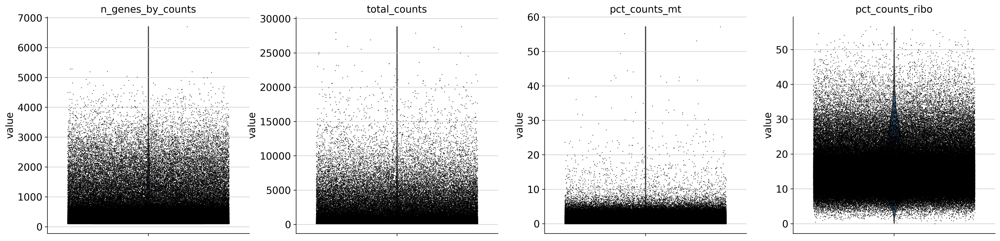

In [16]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"],
    jitter=0.4,
    multi_panel=True,
)

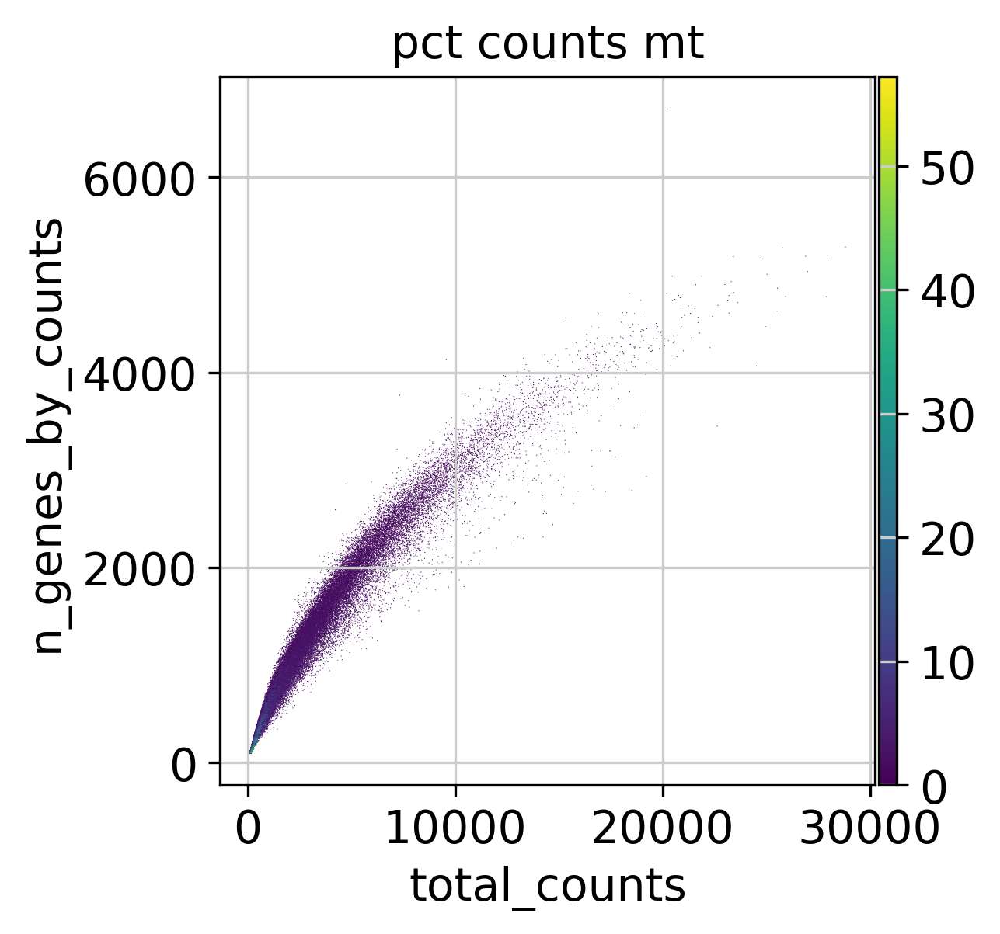

In [17]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [18]:
adata.var["n_cells"] = (adata.X > 0).sum(axis=0).A1
adata.obs["nUMI_per_cell"] = adata.X.sum(axis=1)
adata.obs["ngenes_per_cell"] = (adata.X > 0).sum(axis=1)

In [19]:
(adata.var.n_cells < 3).sum()

1184

In [20]:
adata = adata[:, adata.var.n_cells >= 3]

In [21]:
adata

View of AnnData object with n_obs × n_vars = 380730 × 24330
    obs: 'lib', 'nUMI_per_cell', 'ngenes_per_cell', 'inDrops_version', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_name', 'human_id', 'human_name', 'human_desc', 'eval_forward', 'eval_backward', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'exon', 'intron', 'spanning'

In [22]:
nUMI_per_cell = 150
ngenes_per_cell = 100

adata = adata[(adata.obs.nUMI_per_cell > nUMI_per_cell) & (adata.obs.ngenes_per_cell > ngenes_per_cell), :]

In [23]:
adata

View of AnnData object with n_obs × n_vars = 314240 × 24330
    obs: 'lib', 'nUMI_per_cell', 'ngenes_per_cell', 'inDrops_version', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_name', 'human_id', 'human_name', 'human_desc', 'eval_forward', 'eval_backward', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'exon', 'intron', 'spanning'

# Visualize

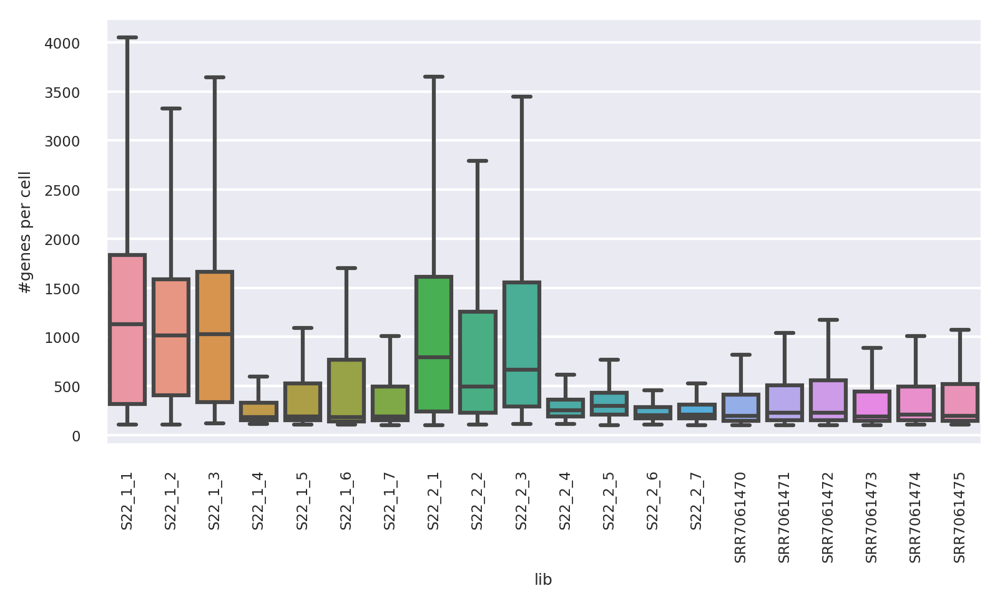

In [24]:
sns.set(font_scale=0.5)
fig, ax = plt.subplots(figsize=(6,3))
sns.boxplot(adata.obs, x="lib", y="ngenes_per_cell", showfliers=False)
plt.ylabel("#genes per cell")
_ = plt.xticks(rotation=90)

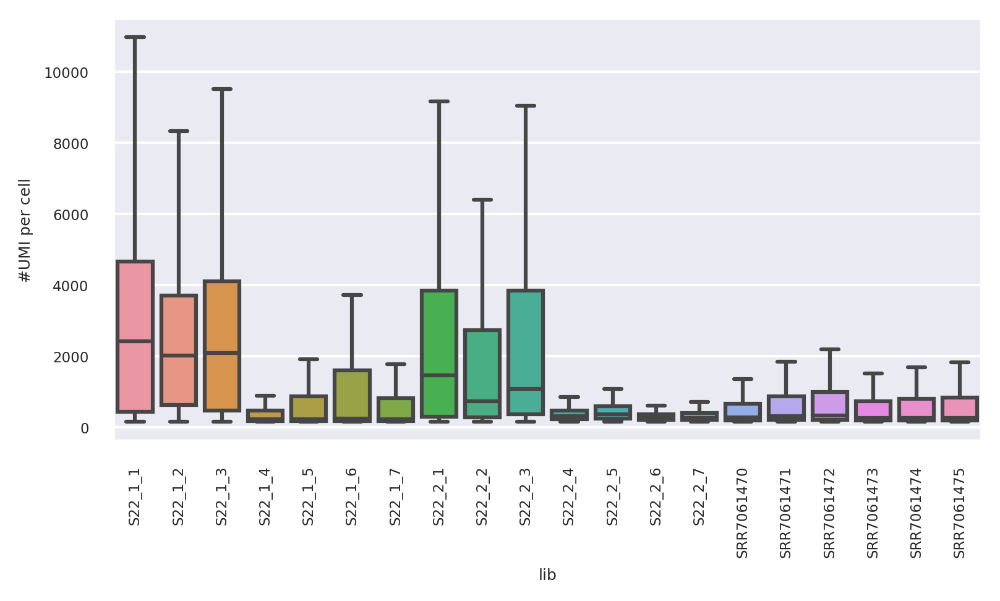

In [25]:
fig, ax = plt.subplots(figsize=(6,3))
sns.boxplot(adata.obs, x="lib", y="nUMI_per_cell", showfliers=False)
plt.ylabel("#UMI per cell")
_ = plt.xticks(rotation=90)

In [26]:
adata.obs_names_make_unique()

In [27]:
# sc.experimental.pp.recipe_pearson_residuals(adata, n_top_genes=100, batch_key="lib", n_comps=30) #, theta=10)
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat_v3', batch_key="lib")
sc.tl.pca(adata, n_comps=30)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:07)


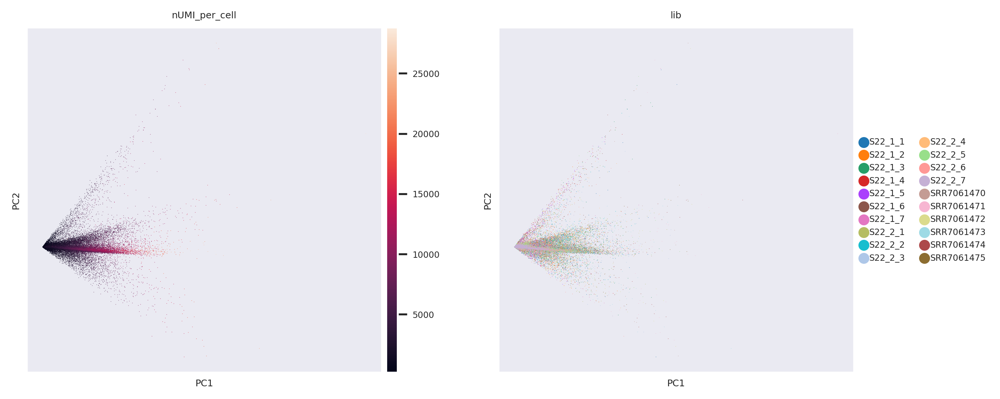

In [28]:
sc.pl.pca(adata, color=["nUMI_per_cell", "lib"])

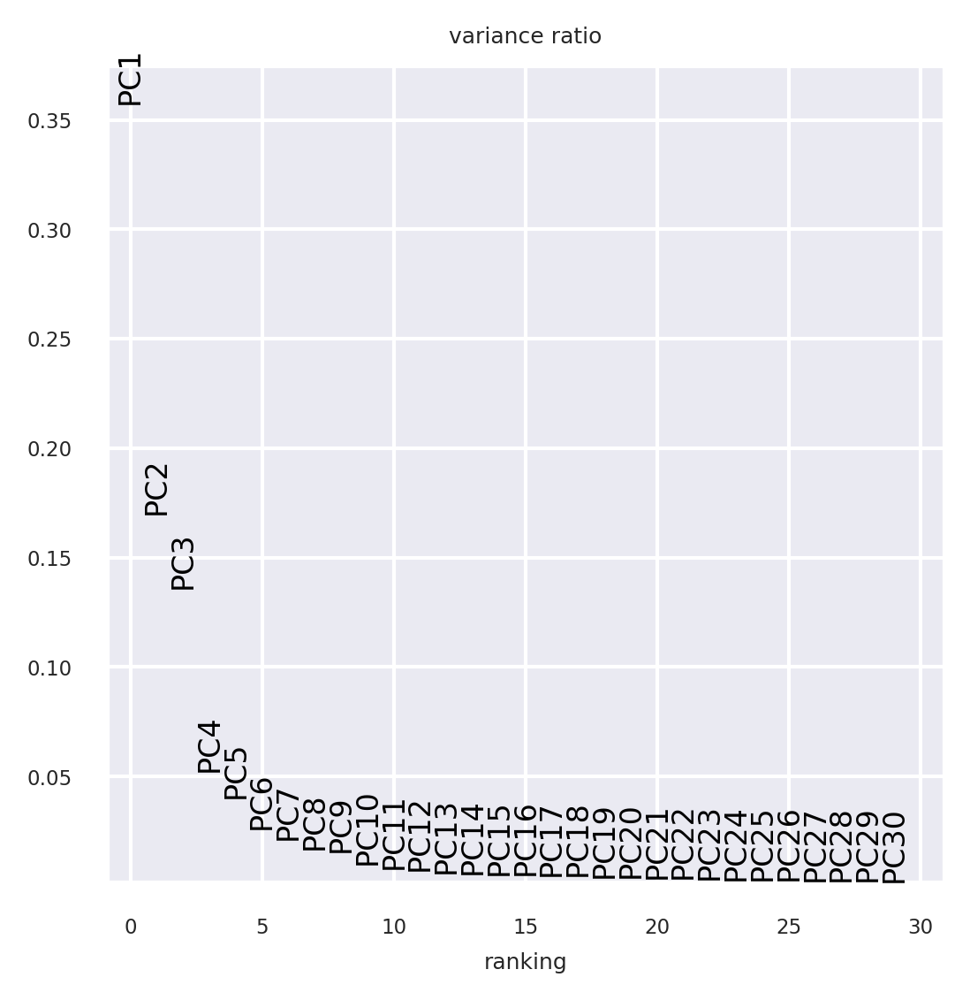

In [29]:
sc.pl.pca_variance_ratio(adata, n_pcs=30)

In [30]:
import gc
gc.collect()

47530

In [31]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=20)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 20


2024-11-30 13:02:01.404011: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-11-30 13:02:01.404041: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:04:51)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:11:18)


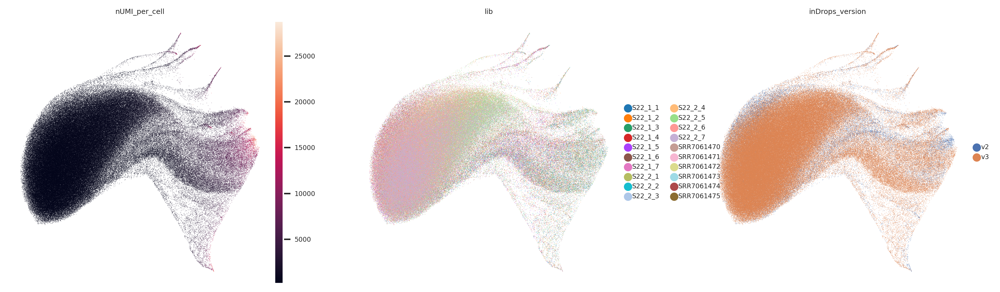

In [32]:
sc.pl.umap(adata, color=["nUMI_per_cell", 'lib', "inDrops_version"], frameon=False, ncols=3)

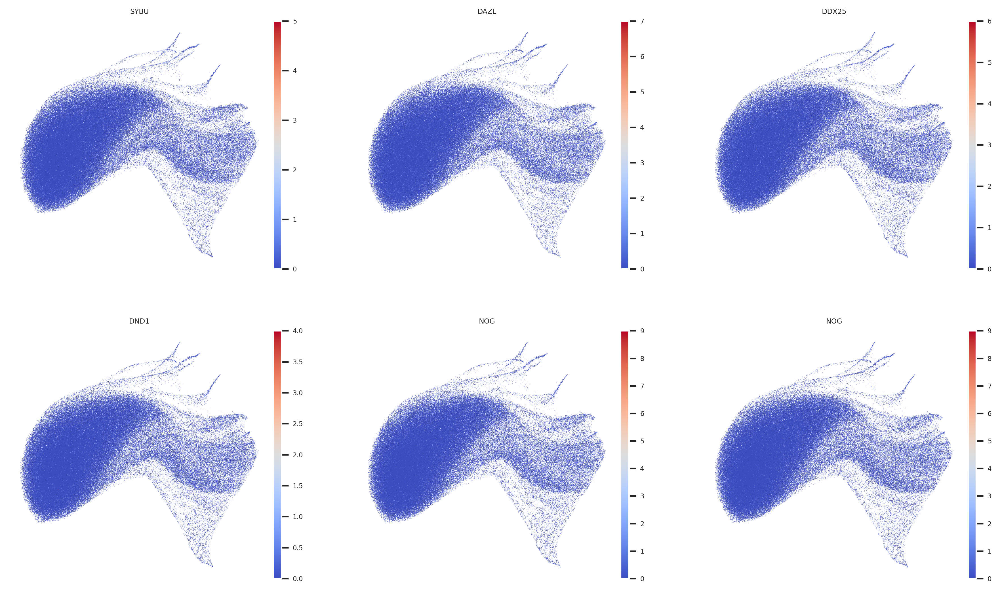

In [33]:
genes = ["ddx25", "dazl", "sybu", "dnd1", "nog", "nog2"]
color = adata.var_names[adata.var["gene_name"].isin(genes)]
names = adata.var.loc[adata.var["gene_name"].isin(genes), "human_name"]
sc.pl.umap(adata, color=color, frameon=False, ncols=3, use_raw=False, title=names, color_map="coolwarm", )

In [34]:
# pearson_residuals_df = adata.uns["pearson_residuals_normalization"].pop("pearson_residuals_df")

In [35]:
# pearson_residuals_df

In [36]:
adata.write(os.path.join(DATA_DIR, "old_atlas", "adata", f"all.{NF_stage}.realigned.corrected.h5ad"))